import libraries

In [2]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [4]:
# code from : https://www.kaggle.com/code/jockeroika/human-bone-fractures#Read-data-file

#path of files 
DATA_DIR = "/kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection"  
train_dir = os.path.join(DATA_DIR, "train")
val_dir = os.path.join(DATA_DIR, "valid")
test_dir = os.path.join(DATA_DIR, "test")
#check about files 
print("📂 Training folders:", os.listdir(train_dir))
print("📂 Validation folders:", os.listdir(val_dir))
print("📂 Test folders:", os.listdir(test_dir))

📂 Training folders: ['labels', 'images']
📂 Validation folders: ['labels', 'images']
📂 Test folders: ['labels', 'images']


In [5]:
#  Transforms (Preprocessing + Augmentation) -->maybe never use
train_transforms = transforms.Compose([
    transforms.Resize((640, 640)),               # ensure correct size
    transforms.RandomHorizontalFlip(),           # augmentation
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(5),                # small rotation
    transforms.ColorJitter(brightness=0.1, saturation=0.05),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],  # ImageNet mean
                         [0.229, 0.224, 0.225]) # ImageNet std
])
val_test_transforms = transforms.Compose([
    transforms.Resize((640, 640)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

📂 /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/train → Found 1347 images


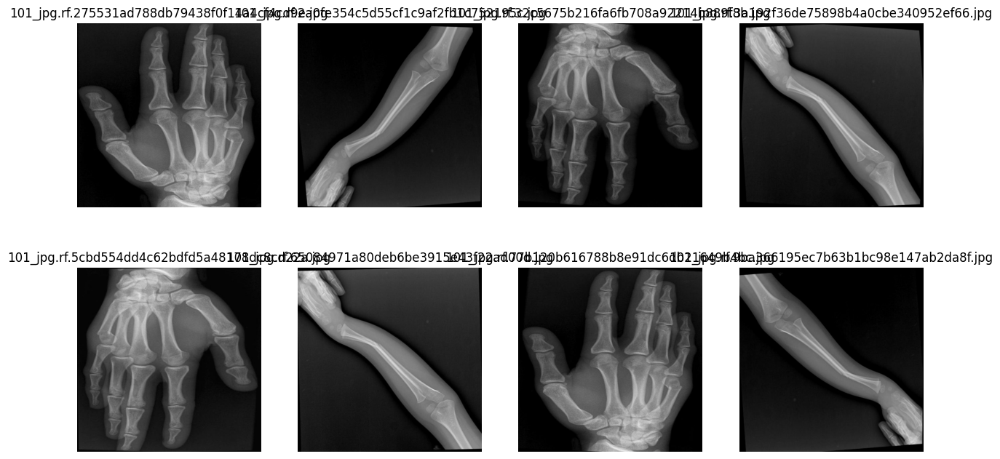

📂 /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/valid → Found 128 images


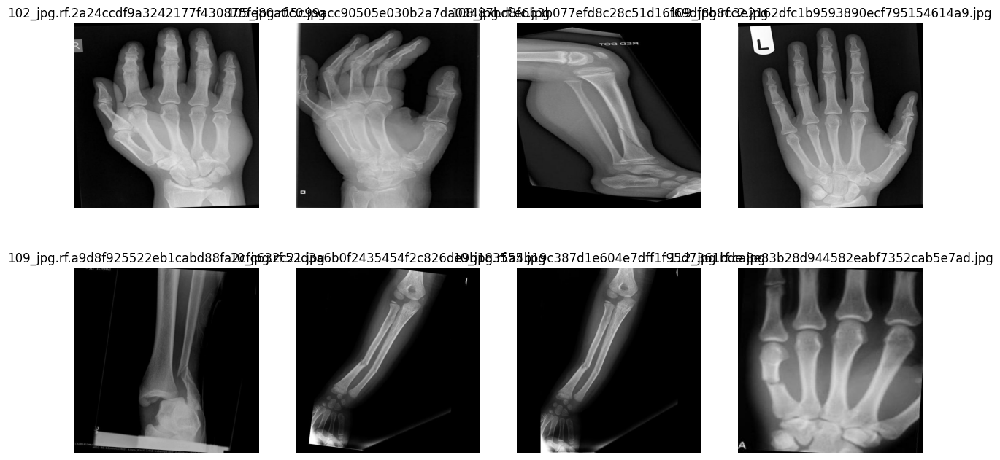

📂 /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/test → Found 64 images


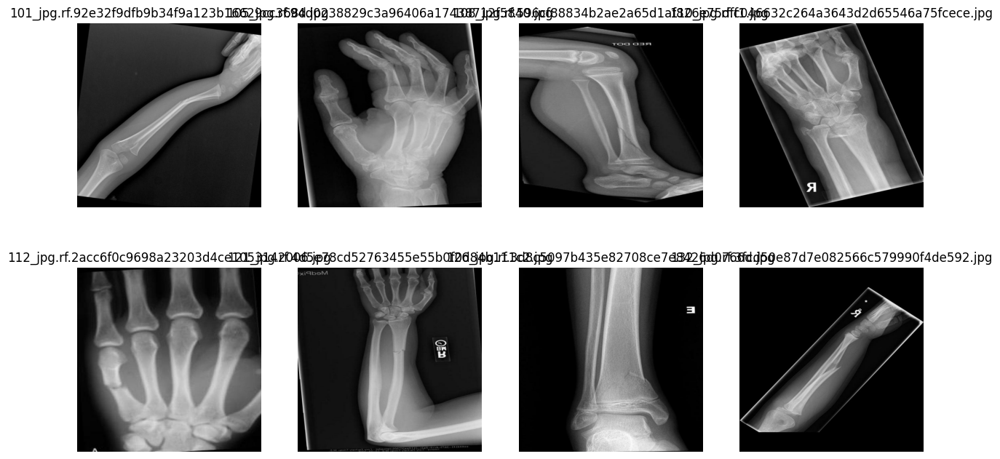

In [6]:
import glob
import matplotlib.pyplot as plt
import cv2

# Function to list & optionally display images from a split
def show_images_from_split(split_dir, max_show=10):
    img_dir = os.path.join(split_dir, "images")
    image_files = sorted(glob.glob(os.path.join(img_dir, "*")))
    print(f"📂 {split_dir} → Found {len(image_files)} images")

    # Display a few
    plt.figure(figsize=(15, 8))
    for i, img_path in enumerate(image_files[:max_show]):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(2, max_show//2, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(os.path.basename(img_path))
    plt.show()

# Show train, val, test
show_images_from_split(train_dir, max_show=8)
show_images_from_split(val_dir, max_show=8)
show_images_from_split(test_dir, max_show=8)


In [7]:
!pip install ultralytics --quiet

from ultralytics import YOLO

* I am new to computer vision and yolo then I decided to use small pretrained model. to understand more about that

In [8]:
model = YOLO('yolov8s.pt')  # Small & fast, good for starting

model.train(
    data='/kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/data.yaml',
    epochs=50,
    imgsz=640,
    batch=16,
    device=0  # GPU
)


Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimi

train: Scanning /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/train/labels... 1347 images, 3 backgrounds, 0 corrupt: 100%|██████████| 1347/1347 [00:06<00:00, 195.54it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 1.2±0.6 ms, read: 3.3±1.2 MB/s, size: 25.1 KB)


val: Scanning /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/valid/labels... 128 images, 0 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<00:00, 168.96it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.56G      2.525      7.498      2.395          8        640: 100%|██████████| 85/85 [00:22<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.17it/s]

                   all        128        157      0.591     0.0925     0.0887     0.0397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.34G      2.127      3.462      2.092          3        640: 100%|██████████| 85/85 [00:21<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.98it/s]

                   all        128        157      0.645     0.0697     0.0883     0.0364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.39G      2.094      2.872      2.062          5        640: 100%|██████████| 85/85 [00:21<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        128        157      0.492      0.196      0.176     0.0717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.41G      2.062      2.647      2.069          6        640: 100%|██████████| 85/85 [00:21<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]

                   all        128        157       0.77      0.131      0.177     0.0823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.46G      1.979      2.424      1.994          5        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.66it/s]

                   all        128        157      0.444      0.168      0.289       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       4.5G      1.941       2.24      1.971          5        640: 100%|██████████| 85/85 [00:22<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all        128        157      0.286      0.381       0.36      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.54G      1.874      2.131      1.884          2        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.81it/s]

                   all        128        157      0.432      0.484      0.435      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.56G      1.838       1.93      1.914          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        128        157      0.676      0.482      0.538      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.61G      1.811      1.854      1.854          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.63it/s]

                   all        128        157      0.612      0.522      0.587       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.65G      1.749      1.743      1.797          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.65it/s]

                   all        128        157      0.484      0.551      0.566      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.68G      1.744       1.67      1.786          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.77it/s]

                   all        128        157      0.564      0.525       0.59      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       4.7G      1.672      1.548      1.762          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.69it/s]

                   all        128        157      0.742      0.542      0.655      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.75G      1.649      1.504      1.732          5        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.58it/s]

                   all        128        157      0.681      0.526      0.661      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.79G      1.639      1.402      1.704          8        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.59it/s]

                   all        128        157      0.808      0.571        0.7      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.83G      1.607      1.351      1.676          2        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]

                   all        128        157      0.714      0.619      0.705      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.85G      1.622      1.366      1.693          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]

                   all        128        157      0.752      0.688      0.683      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       4.9G       1.58       1.26      1.637          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.74it/s]

                   all        128        157      0.777      0.676      0.755      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.94G      1.565      1.232      1.653          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        128        157      0.734      0.671      0.722      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.97G      1.532      1.228      1.632          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.75it/s]

                   all        128        157      0.857      0.673      0.762      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.99G      1.481      1.152      1.561          8        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.77it/s]

                   all        128        157       0.79      0.758      0.802      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.04G      1.468      1.172      1.579          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.75it/s]

                   all        128        157      0.913      0.703      0.819      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.08G      1.474      1.076      1.565          6        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.69it/s]

                   all        128        157       0.87      0.743      0.833      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.12G      1.436      1.104      1.532          5        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.74it/s]

                   all        128        157      0.867      0.691      0.815      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.14G      1.437      1.089      1.518          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        128        157      0.886      0.693      0.821      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.19G      1.428      1.029      1.529          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.75it/s]

                   all        128        157      0.862       0.75      0.846      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.23G      1.379      1.006      1.513          5        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.69it/s]

                   all        128        157      0.881      0.803      0.897       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.26G      1.362     0.9385      1.472          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.64it/s]

                   all        128        157      0.906      0.788      0.876      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.29G      1.324      0.919      1.449          6        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        128        157      0.792      0.838      0.871      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.34G      1.337     0.8987      1.449          2        640: 100%|██████████| 85/85 [00:22<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]

                   all        128        157      0.827      0.858       0.86      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.37G      1.313     0.8885      1.436          8        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.44it/s]

                   all        128        157      0.945      0.856      0.913      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.73G      1.275     0.8669      1.419          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.72it/s]

                   all        128        157      0.896      0.841      0.905      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.75G      1.278     0.8464      1.384          6        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        128        157      0.936      0.893      0.919      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       5.8G      1.271     0.8458      1.418          7        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]

                   all        128        157      0.894       0.86        0.9      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.84G      1.257     0.8547      1.398         10        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.73it/s]

                   all        128        157      0.889      0.828      0.899      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.88G      1.249     0.8681      1.398          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        128        157      0.908      0.795      0.903      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       5.9G      1.214     0.7958      1.353          8        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.76it/s]

                   all        128        157       0.89       0.86       0.91      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.95G      1.214     0.7895      1.367          9        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.80it/s]

                   all        128        157      0.923      0.847      0.908      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.99G      1.196     0.7782      1.343          9        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.80it/s]

                   all        128        157      0.937      0.852      0.917      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.02G      1.176     0.7616      1.337          7        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]

                   all        128        157      0.896      0.883      0.918      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.04G      1.175     0.7827      1.329          1        640: 100%|██████████| 85/85 [00:22<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        128        157      0.931      0.841      0.914      0.487


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       6.1G      1.121     0.6118      1.374          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        128        157      0.915      0.855      0.904      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.13G      1.051     0.5643      1.314          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        128        157      0.938       0.86      0.901      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.17G      1.041     0.5488       1.31          5        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.78it/s]

                   all        128        157      0.931      0.878      0.912      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.19G      1.039     0.5429      1.309          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.70it/s]

                   all        128        157       0.95      0.878      0.922       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.24G      1.017     0.5426      1.294          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.81it/s]

                   all        128        157      0.959      0.873      0.918      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       6.6G     0.9776     0.5122       1.25          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        128        157      0.964       0.87      0.924      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.64G     0.9847     0.5138      1.259          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.66it/s]

                   all        128        157       0.94       0.87      0.908      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.66G     0.9568     0.4981      1.244          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.82it/s]

                   all        128        157      0.962      0.878      0.921      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.71G     0.9352     0.4857      1.234          4        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.74it/s]

                   all        128        157      0.958      0.878      0.926      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.75G     0.9168     0.4808      1.212          3        640: 100%|██████████| 85/85 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.72it/s]

                   all        128        157      0.966       0.87      0.925      0.488



50 epochs completed in 0.330 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 22.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        128        157      0.962      0.877      0.921      0.495
            Comminuted         15         15          1      0.763      0.816      0.472
            Greenstick         10         10      0.992        0.6      0.626      0.217
               Healthy          7          7      0.977          1      0.995      0.739
                Linear          1          1      0.859          1      0.995      0.298
     Oblique Displaced         30         30          1      0.903      0.961      0.424
               Oblique          7          7          1      0.751      0.978      0.584
             Segmental          3          3      0.924          1      0.995      0.859
                Spiral          5          5       0.98          1      0.995      0.476
  Transverse Displaced         53         65      0.894      0.775      0.853      0.349
            Transverse         11         14          1       0.98      0.995      0.527
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78745d7274d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

In [9]:
metrics = model.val()
print(metrics)

Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.9±0.4 ms, read: 70.0±18.7 MB/s, size: 32.4 KB)


val: Scanning /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/valid/labels... 128 images, 0 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<00:00, 712.33it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.99it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        128        157      0.962      0.878      0.922       0.49
            Comminuted         15         15          1      0.763      0.816      0.469
            Greenstick         10         10      0.991        0.6      0.626      0.217
               Healthy          7          7      0.976          1      0.995      0.739
                Linear          1          1      0.857          1      0.995      0.298
     Oblique Displaced         30         30          1      0.907      0.978      0.433
               Oblique          7          7          1      0.752      0.978      0.584
             Segmental          3          3      0.923          1      0.995      0.808
                Spiral          5          5      0.979          1      0.995      0.476
  Transverse Displaced         53         65      0.894      0.776      0.852       0.35
            Transverse         11         14          1      0.982      0.995      0.527
Speed: 2.7ms preproce

In [10]:
results = model.predict(
    source='/kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/test/images',
    conf=0.25
)


image 1/64 /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/test/images/101_jpg.rf.92e32f9dfb9b34f9a123b16629cc368d.jpg: 640x640 1 Spiral, 16.2ms
image 2/64 /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/test/images/105_jpg.rf.94d0238829c3a96406a17438712f5840.jpg: 640x640 1 Oblique Displaced, 16.3ms
image 3/64 /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/test/images/108_jpg.rf.596cf88834b2ae2a65d1af826e75dff1.jpg: 640x640 1 Oblique Displaced, 16.3ms
image 4/64 /kaggle/input/human-bone-fractures-image-dataset/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection/test/images/110_jpg.rf.c046632c264a3643d2d65546a75fcece.jpg: 640x640 1 Transverse Displaced, 16.2ms
image 5/64 /kaggle/input/human-bone-fractures-image-dat

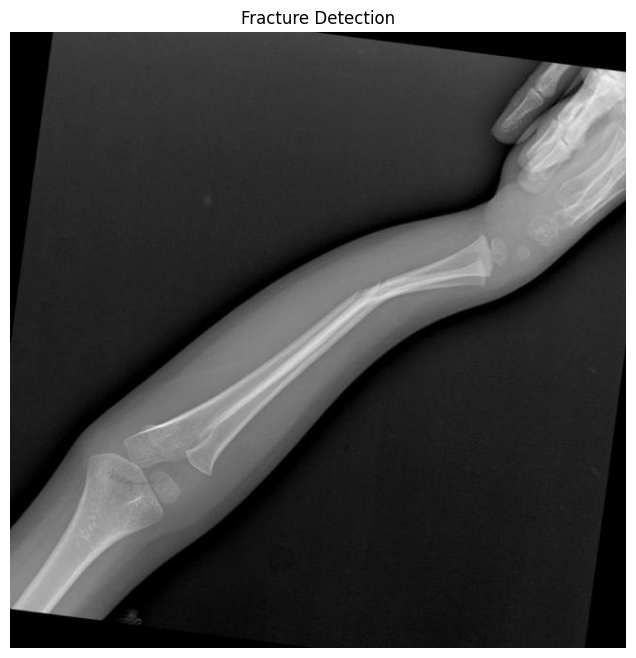

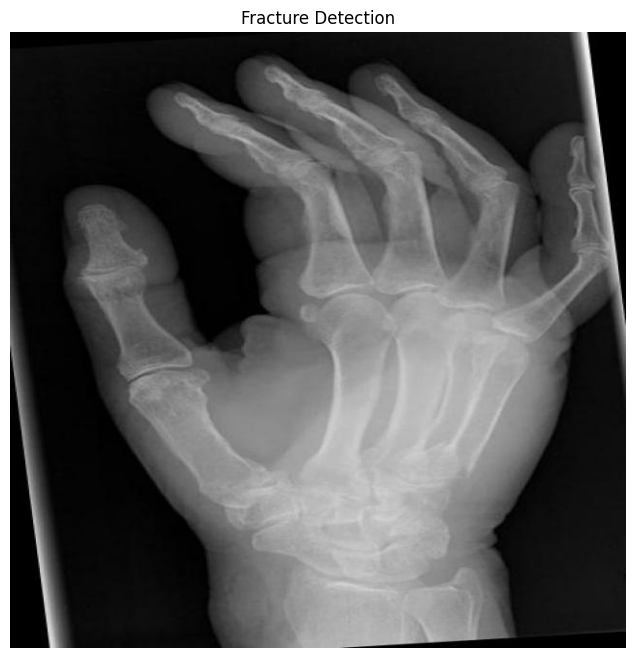

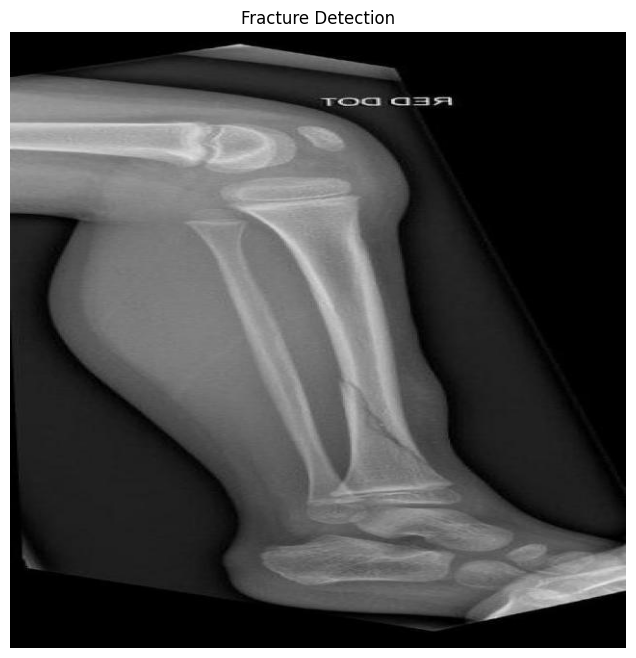

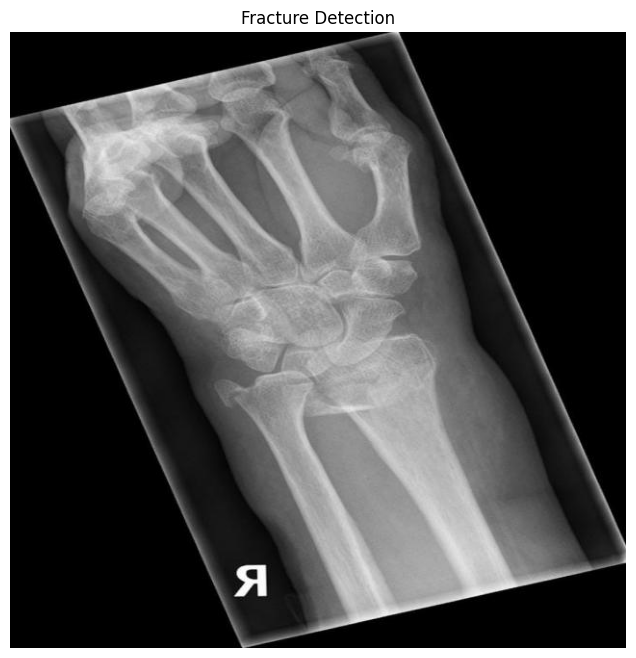

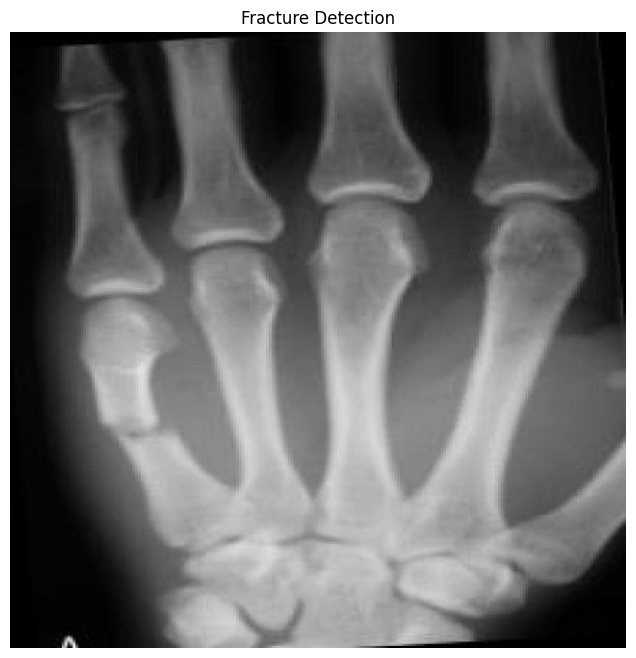

...

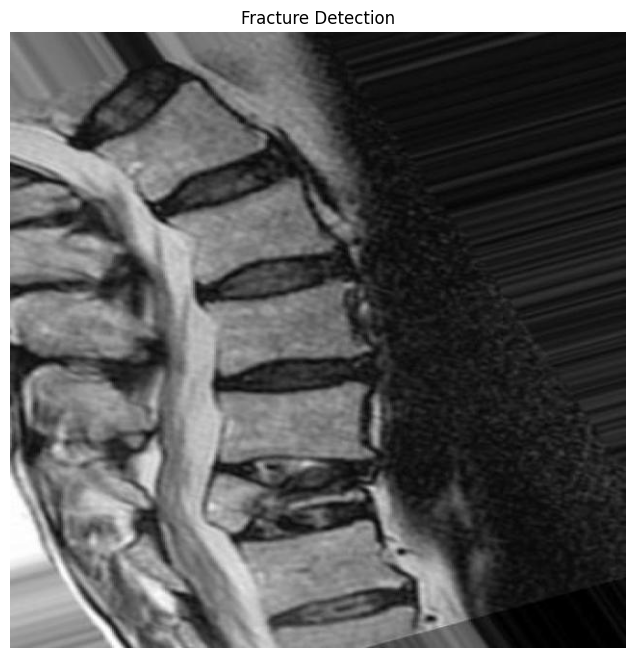

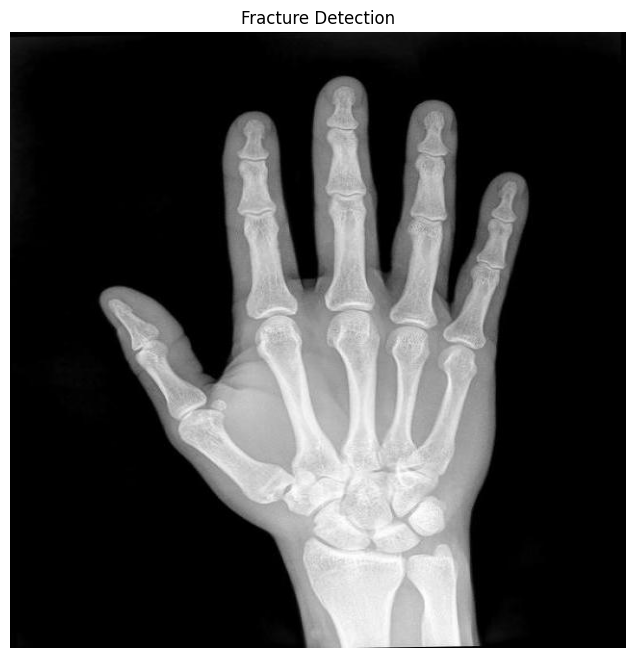

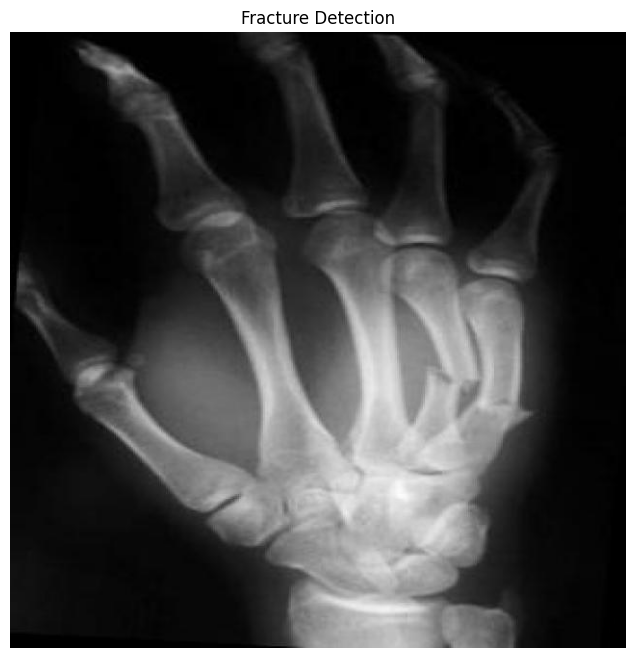

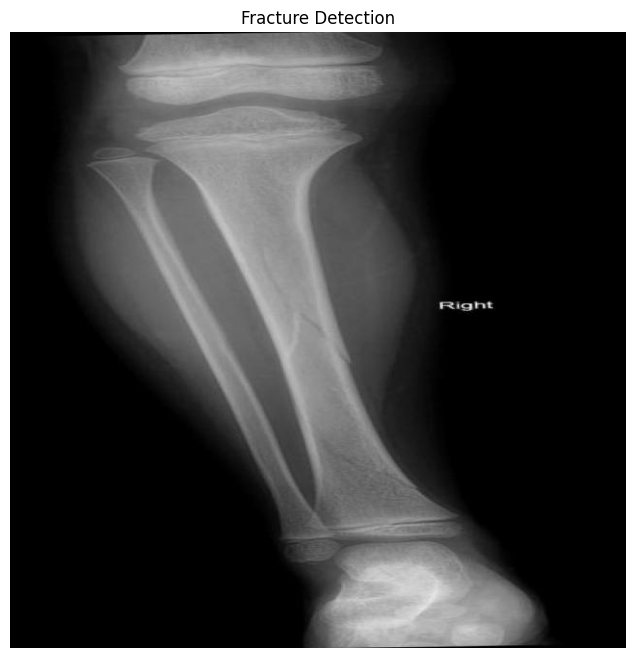

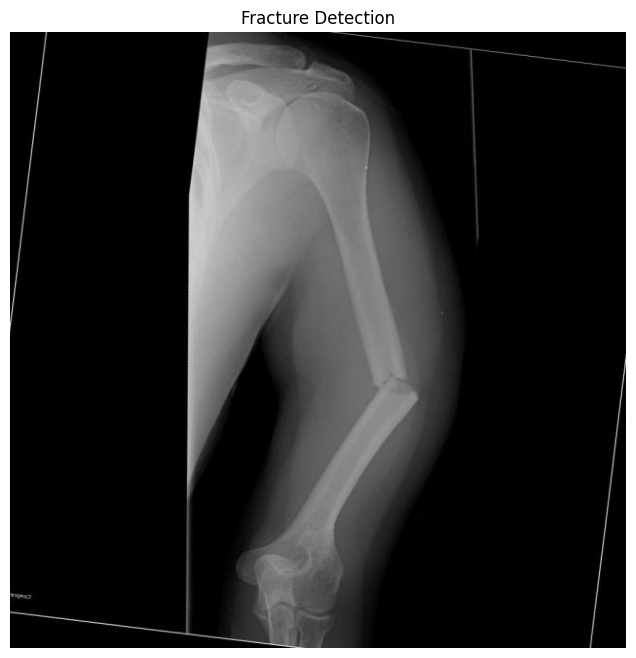

In [11]:
import matplotlib.pyplot as plt
import cv2

for r in results:
    img = cv2.imread(r.path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title("Fracture Detection")
    plt.axis("off")
    plt.show()